## Welcome and Introduction
This week's project is an attempt to transform images from a given set (photo_jpg) to resemble images from another set (monet_jpg).
This is the Kaggle [I'm Something of a Painter Myself](https://www.kaggle.com/competitions/gan-getting-started/) competition.
We'll be using a GAN to tackle this challenge.

The dataset contains a folder of images in the style of Monet, called monet_jpg, and the task is to convert the images in the photos_jpg folder into this same style. The challenge allows adding more images than those existing in the photos_jpg, but we will be sticking with the existing images.

## Imports


In [ ]:
!pip install optuna

In [ ]:
import pandas as pd
import numpy as np
import os
import tensorflow as tf
import random
import zipfile
import matplotlib.pyplot as plt
import time
import torch
import torch.nn as nn
import torch.optim as optim
import glob
import keras_tuner as kt
import optuna

from tqdm import tqdm
from torchvision import transforms, datasets, utils
from torch.utils.data import DataLoader, Dataset
from torchvision.datasets import ImageFolder, DatasetFolder
from torchvision.io import read_image

from sklearn.metrics import accuracy_score
from tensorflow.keras import layers
from google.colab import files
from PIL import Image




## Fetch Dataset


In [ ]:
if not os.path.exists("kaggle.json") and not os.path.exists(".kaggle/kaggle.json"):
    files.upload()
    !mkdir -p ~/.kaggle
    !cp kaggle.json ~/.kaggle/
    !chmod 600 ~/.kaggle/kaggle.json

Download the data

In [ ]:
!kaggle competitions download -c gan-getting-started

gan-getting-started.zip: Skipping, found more recently modified local copy (use --force to force download)


In [ ]:
if not os.path.exists("dataset"):
    with zipfile.ZipFile("gan-getting-started.zip", 'r') as zip_ref:
        zip_ref.extractall("dataset")

## Verify data


In [ ]:
dataset_path = './dataset/'

# List and print the contents of the directory
contents = os.listdir(dataset_path)
print("Contents of the directory:", dataset_path)
for item in contents:
    print(item)

Contents of the directory: ./dataset/
monet_jpg
photo_jpg
monet_tfrec
photo_tfrec


In [ ]:
monet_dir = os.path.join(dataset_path, "monet_jpg")
photo_dir = os.path.join(dataset_path, "photo_jpg")
print("Count of monet_jpg:", len(os.listdir(monet_dir)))
print("Count of photo_jpg:", len(os.listdir(photo_dir)))

Count of monet_jpg: 300
Count of photo_jpg: 7038


## Exploratory Data Analysis (EDA)
Let's explore the data a little bit.

## Visualize Data
View a random sampling of the images

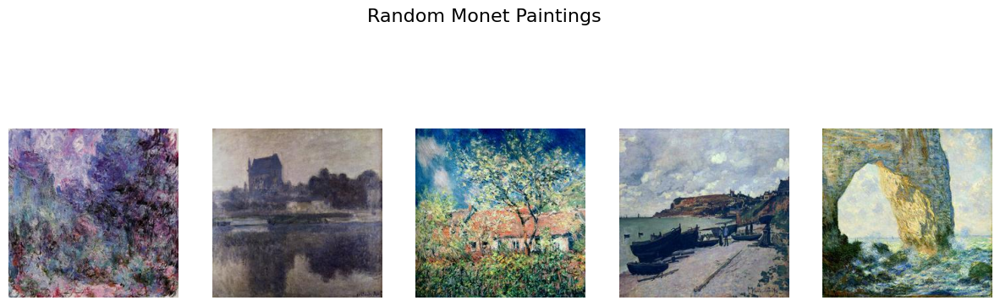

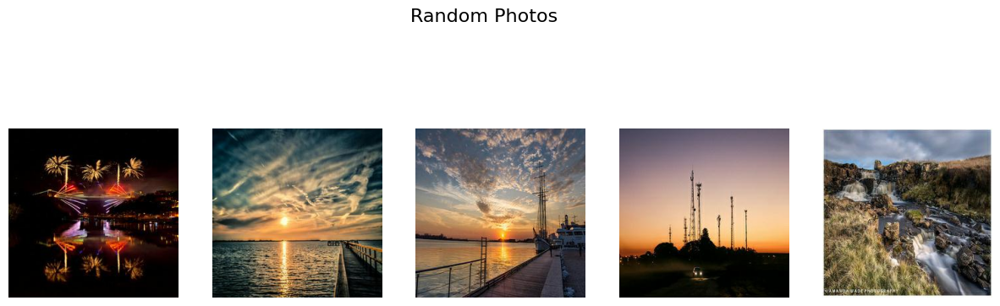

In [ ]:
# Function to load 5 random images from a directory
def display_random_images(directory, title):
    image_paths = [os.path.join(directory, file) for file in os.listdir(directory) if file.endswith(('.jpg', '.png'))]
    random_images = random.sample(image_paths, 5)

    # Display images
    fig, axes = plt.subplots(1, 5, figsize=(15, 5))
    fig.suptitle(title, fontsize=16)
    for i, img_path in enumerate(random_images):
        image = Image.open(img_path).convert("RGB")
        axes[i].imshow(image)
        axes[i].axis('off')
    plt.show()

# Display 5 random images from Monet and Photo datasets
display_random_images(monet_dir, "Random Monet Paintings")
display_random_images(photo_dir, "Random Photos")


## Image Properties
Let's check the image dimensions, channels and pixel intensity

In [ ]:
def analyze_images(image_folder):
    """
    Analyzes all .jpg images in a folder and returns dimensions, channels, and pixel mean intensities.

    Args:
        image_folder (str): Path to the folder containing the images.

    Returns:
        dict: A dictionary containing:
            - 'dimensions': Numpy array of image dimensions (width, height)
            - 'channels': Numpy array of channel counts for each image
            - 'pixel_means': Numpy array of mean pixel intensities
    """
    # Initialize lists to store image properties
    dimensions = []
    channels = []
    pixel_means = []

    # List all .jpg files in the folder
    all_images = [f for f in os.listdir(image_folder) if f.endswith('.jpg')]

    if len(all_images) == 0:
        print("No .jpg images found in the folder.")
        return None

    # Analyze each image
    for img_file in all_images:
        img_path = os.path.join(image_folder, img_file)
        try:
            with Image.open(img_path) as img:
                # Get image dimensions and number of channels
                dimensions.append(img.size)  # (width, height)
                channels.append(len(img.getbands()))
                # Calculate mean pixel intensity
                pixel_means.append(np.array(img).mean())
        except Exception as e:
            print(f"Warning: Could not process {img_file}. Error: {e}")

    # Convert lists to numpy arrays
    dimensions = np.array(dimensions)
    channels = np.array(channels)
    pixel_means = np.array(pixel_means)

    # Return results as a dictionary
    return {
        'dimensions': dimensions,
        'channels': channels,
        'pixel_means': pixel_means
    }



## Process monet_jpg

Unique image dimensions: [[256 256]]
Unique channel counts: [3]


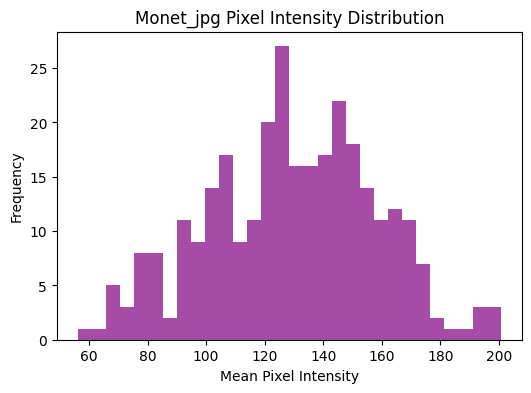

In [ ]:
# Run analysis on monet_dir
results = analyze_images(monet_dir)

if results:
    # Display unique dimensions and channel counts
    print('Unique image dimensions:', np.unique(results['dimensions'], axis=0))
    print('Unique channel counts:', np.unique(results['channels']))

    # Plot pixel intensity distribution
    plt.figure(figsize=(6, 4))
    plt.hist(results['pixel_means'], bins=30, color='purple', alpha=0.7)
    plt.title('Monet_jpg Pixel Intensity Distribution')
    plt.xlabel('Mean Pixel Intensity')
    plt.ylabel('Frequency')
    plt.show()


## Process photo_jpg

Unique image dimensions: [[256 256]]
Unique channel counts: [3]


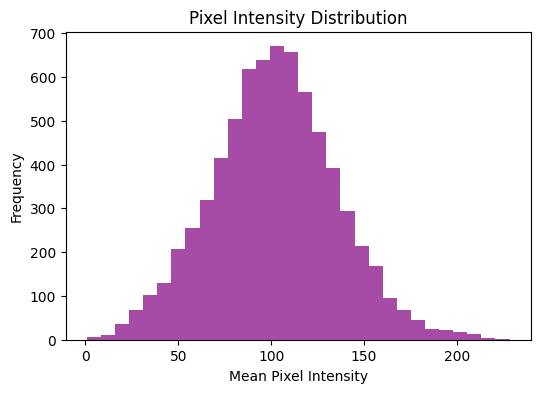

In [ ]:
# Run analysis
results = analyze_images(photo_dir)

if results:
    # Display unique dimensions and channel counts
    print('Unique image dimensions:', np.unique(results['dimensions'], axis=0))
    print('Unique channel counts:', np.unique(results['channels']))

    # Plot pixel intensity distribution
    plt.figure(figsize=(6, 4))
    plt.hist(results['pixel_means'], bins=30, color='purple', alpha=0.7)
    plt.title('Pixel Intensity Distribution')
    plt.xlabel('Mean Pixel Intensity')
    plt.ylabel('Frequency')
    plt.show()


## Enable multi threading
Training was very slow, so enable multi-threading to speed things up

In [ ]:
tf.config.threading.set_intra_op_parallelism_threads(4)
tf.config.threading.set_inter_op_parallelism_threads(4)

## Helper functions
Some helper functions

In [ ]:
# Image dimensions
IMG_HEIGHT = 256
IMG_WIDTH = 256
BATCH_SIZE = 1
AUTOTUNE = tf.data.AUTOTUNE

# Function to load and preprocess images
def load_image(image_file):
    img = tf.io.read_file(image_file)
    img = tf.image.decode_jpeg(img, channels=3)
    img = tf.image.resize(img, [IMG_HEIGHT, IMG_WIDTH])
    img = (img / 127.5) - 1  # Normalize to [-1, 1]
    return img

# Function to load datasets
def load_dataset(image_folder):
    image_paths = tf.data.Dataset.list_files(os.path.join(image_folder, "*.jpg"), shuffle=True)
    dataset = image_paths.map(load_image, num_parallel_calls=AUTOTUNE)
    return dataset.batch(BATCH_SIZE).prefetch(AUTOTUNE)

# Display example images
def show_images(dataset, title, num=4):
    plt.figure(figsize=(8, 8))
    for images in dataset.take(1):
        for i in range(num):
            plt.subplot(2, 2, i+1)
            plt.imshow((images[i] + 1) / 2)
            plt.axis('off')
    plt.suptitle(title)
    plt.show()

## View Generated Images
Function that enables viewing the generated images

In [ ]:
def display_generated_images():
    sample_images = random.sample(os.listdir(photo_dir), 5)
    plt.figure(figsize=(15, 6))
    for i, image_file in enumerate(sample_images):
        img_path = os.path.join(photo_dir, image_file)
        input_image = load_image(img_path)
        input_image = tf.expand_dims(input_image, axis=0)

        generated_image = generator_g(input_image, training=False)

        plt.subplot(2, 5, i+1)
        plt.imshow((input_image[0] + 1) / 2)
        plt.axis('off')

        plt.subplot(2, 5, i+6)
        plt.imshow((generated_image[0] + 1) / 2)
        plt.axis('off')
    plt.show()


## Train with subset of images
Training with all the images was taking too long, so we're going to train with 100 images

In [ ]:
# Create datasets
photo_dataset = load_dataset(photo_dir).take(100)
monet_dataset = load_dataset(monet_dir).take(100)


## Model Architecture
For this task, we're going to train a CycleGAN. In this CycleGAN, we'll have two generators and two discriminators trained together in an adversarial manner. One generator generates Monet -> Photos and the other Photos -> Monets.

We chose CycleGAN because it is relatively easy compared to some of the other architectures, and has extensive documentation and examples that could be relied on.

For the Discriminators, we've opted to use the PatchGAN method where we look at subsets of the image and determine if that subset is real/fake, rather than an outright decision on if the entire image is real or fake.

## Generator Model
The generator can be divided into five major tasks
* Input - Receives an input image
* Downsampling - Reduce the image dimensions while increasing the number of features to enable extraction of higher level features
* Residual Blocks - Refines features extracted during downsampling and preserves the image content while applying transformations
* Upsampling - Expand the image back to its original dimensions
* Final Activation with 'tanh' to ensure the output in within range

In [ ]:
# Build Generator
def build_generator():
    inputs = layers.Input(shape=[IMG_HEIGHT, IMG_WIDTH, 3])

    # Downsampling
    x = layers.Conv2D(64, 4, strides=2, padding='same')(inputs)
    x = layers.LeakyReLU()(x)

    x = layers.Conv2D(128, 4, strides=2, padding='same')(x)
    x = layers.LeakyReLU()(x)

    # Residual blocks
    for _ in range(4):
        res = x
        x = layers.Conv2D(128, 3, padding='same')(x)
        x = layers.LeakyReLU()(x)
        x = layers.Conv2D(128, 3, padding='same')(x)
        x = layers.Add()([x, res])

    # Upsampling
    x = layers.Conv2DTranspose(64, 4, strides=2, padding='same')(x)
    x = layers.LeakyReLU()(x)

    x = layers.Conv2DTranspose(3, 4, strides=2, padding='same', activation='tanh')(x)

    return tf.keras.Model(inputs, x)


## Discriminator Model
This discriminator model looks at patches of the image to determine if it's real or fake, rather than looking at the entire image.
The layers are
* Input - Receives an image with the given dimensions
* First Convolution layer - Reduce dimension by half and applies 64 filters
* Second Convolution layer - Halves dimension again while increasing filters to 128
* Third Convolution layer - Halves dimension while doubling filters again
* Fourth Convolution layer - Reduce the feature map to 1 channel, where each value is whether the corresponding image patch is real or fake


In [ ]:
# Build Discriminator
def build_discriminator():
    inputs = layers.Input(shape=[IMG_HEIGHT, IMG_WIDTH, 3])
    x = layers.Conv2D(64, 4, strides=2, padding='same')(inputs)
    x = layers.LeakyReLU()(x)

    x = layers.Conv2D(128, 4, strides=2, padding='same')(x)
    x = layers.LeakyReLU()(x)

    x = layers.Conv2D(256, 4, strides=2, padding='same')(x)
    x = layers.LeakyReLU()(x)

    x = layers.Conv2D(1, 4, strides=1, padding='same')(x)

    return tf.keras.Model(inputs, x)


## Instantiate the models
Build two generators and two discriminators


In [ ]:
# Instantiate models
generator_g = build_generator()  # Photo -> Monet
generator_f = build_generator()  # Monet -> Photo
discriminator_x = build_discriminator()
discriminator_y = build_discriminator()

# Loss functions
loss_obj = tf.keras.losses.BinaryCrossentropy(from_logits=True)


## loss functions


In [ ]:
def discriminator_loss(real, generated):
    real_loss = loss_obj(tf.ones_like(real), real)
    generated_loss = loss_obj(tf.zeros_like(generated), generated)
    return (real_loss + generated_loss) * 0.5

def generator_loss(generated):
    return loss_obj(tf.ones_like(generated), generated)

def calc_cycle_loss(real_image, cycled_image, lambda_cycle=10):
    return tf.reduce_mean(tf.abs(real_image - cycled_image)) * lambda_cycle


## Optimizers


In [ ]:
generator_g_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
generator_f_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_x_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_y_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)


## Training Function
The step that trains the CycleGAN.
It has four main tasks
* Generate images between both domains
* Evaluate realness of the generated images
* Compute the loss
* Calculate and apply gradients

In [ ]:
@tf.function
def train_step(real_x, real_y):
    with tf.GradientTape(persistent=True) as tape:
        fake_y = generator_g(real_x, training=True)
        cycled_x = generator_f(fake_y, training=True)

        fake_x = generator_f(real_y, training=True)
        cycled_y = generator_g(fake_x, training=True)

        disc_real_x = discriminator_x(real_x, training=True)
        disc_real_y = discriminator_y(real_y, training=True)

        disc_fake_x = discriminator_x(fake_x, training=True)
        disc_fake_y = discriminator_y(fake_y, training=True)

        gen_g_loss = generator_loss(disc_fake_y)
        gen_f_loss = generator_loss(disc_fake_x)
        total_cycle_loss = calc_cycle_loss(real_x, cycled_x) + calc_cycle_loss(real_y, cycled_y)

        total_gen_g_loss = gen_g_loss + total_cycle_loss
        total_gen_f_loss = gen_f_loss + total_cycle_loss

        disc_x_loss = discriminator_loss(disc_real_x, disc_fake_x)
        disc_y_loss = discriminator_loss(disc_real_y, disc_fake_y)

    # Gradients and update
    generator_g_optimizer.apply_gradients(zip(tape.gradient(total_gen_g_loss, generator_g.trainable_variables), generator_g.trainable_variables))
    generator_f_optimizer.apply_gradients(zip(tape.gradient(total_gen_f_loss, generator_f.trainable_variables), generator_f.trainable_variables))
    discriminator_x_optimizer.apply_gradients(zip(tape.gradient(disc_x_loss, discriminator_x.trainable_variables), discriminator_x.trainable_variables))
    discriminator_y_optimizer.apply_gradients(zip(tape.gradient(disc_y_loss, discriminator_y.trainable_variables), discriminator_y.trainable_variables))

    return total_gen_g_loss, disc_x_loss

## Run the training

Epoch 1: Generator Loss: 312.8929, Discriminator Loss: 64.9165
Epoch 2: Generator Loss: 331.4371, Discriminator Loss: 67.5548
Epoch 3: Generator Loss: 330.9873, Discriminator Loss: 66.2986
Epoch 4: Generator Loss: 330.5240, Discriminator Loss: 67.9476
Epoch 5: Generator Loss: 301.9732, Discriminator Loss: 65.6723


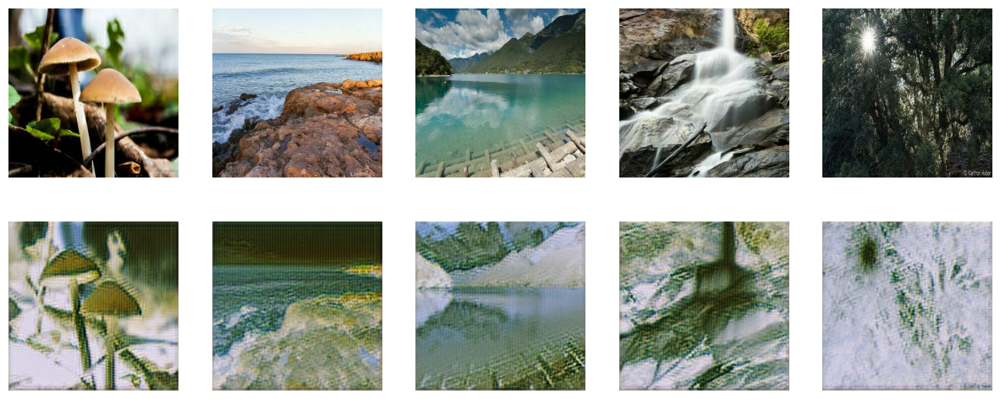

Epoch 6: Generator Loss: 314.2347, Discriminator Loss: 65.6725
Epoch 7: Generator Loss: 307.0527, Discriminator Loss: 66.5280
Epoch 8: Generator Loss: 298.8538, Discriminator Loss: 66.6695
Epoch 9: Generator Loss: 308.1615, Discriminator Loss: 67.7919
Epoch 10: Generator Loss: 301.3286, Discriminator Loss: 66.8439


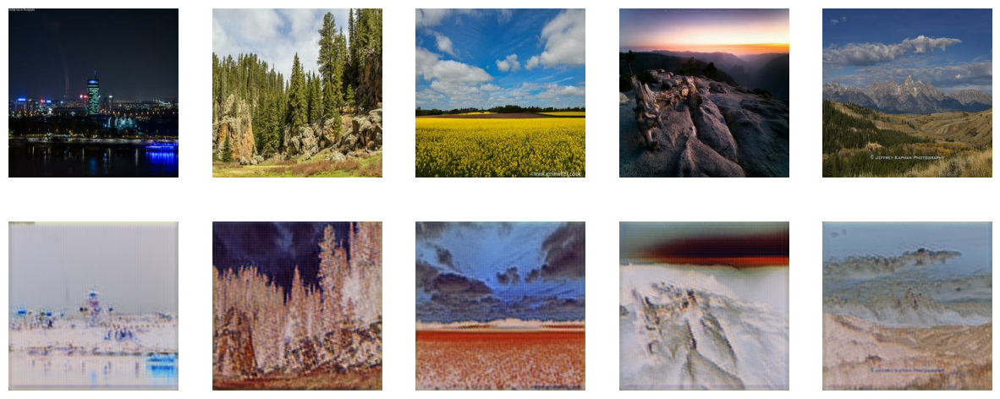

Epoch 11: Generator Loss: 294.8469, Discriminator Loss: 68.1036
Epoch 12: Generator Loss: 304.9550, Discriminator Loss: 68.4917
Epoch 13: Generator Loss: 290.8401, Discriminator Loss: 66.5959
Epoch 14: Generator Loss: 278.2303, Discriminator Loss: 66.5492
Epoch 15: Generator Loss: 275.5118, Discriminator Loss: 66.4746


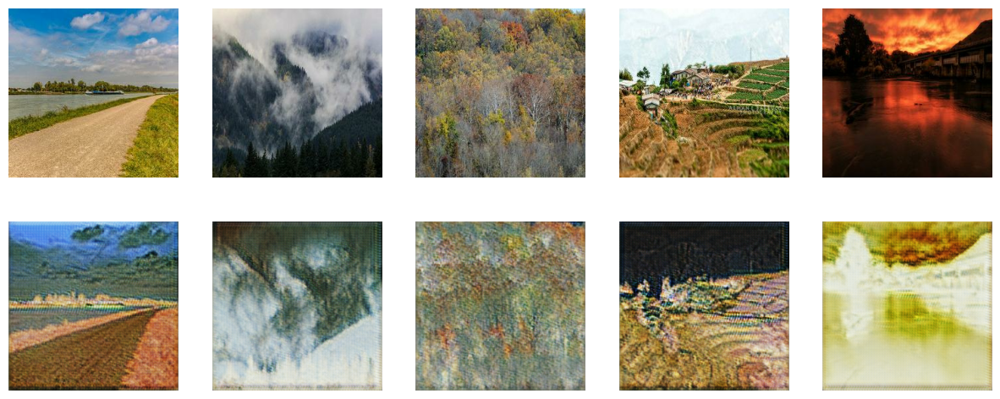

Epoch 16: Generator Loss: 269.0546, Discriminator Loss: 67.3625
Epoch 17: Generator Loss: 272.7752, Discriminator Loss: 67.1563
Epoch 18: Generator Loss: 255.8800, Discriminator Loss: 67.7706
Epoch 19: Generator Loss: 269.2980, Discriminator Loss: 65.9546
Epoch 20: Generator Loss: 279.0190, Discriminator Loss: 65.6820


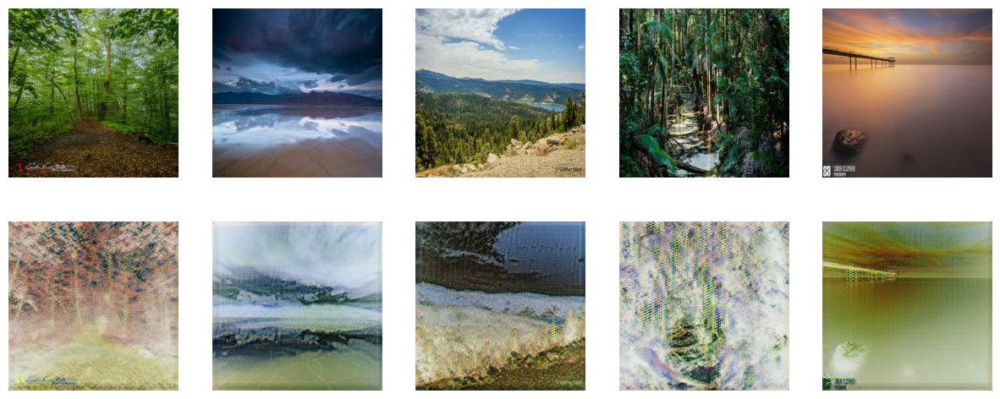

Epoch 21: Generator Loss: 262.5581, Discriminator Loss: 67.2827
Epoch 22: Generator Loss: 259.9847, Discriminator Loss: 67.2796
Epoch 23: Generator Loss: 248.9896, Discriminator Loss: 66.2914
Epoch 24: Generator Loss: 253.3721, Discriminator Loss: 67.5686
Epoch 25: Generator Loss: 261.7488, Discriminator Loss: 66.7692


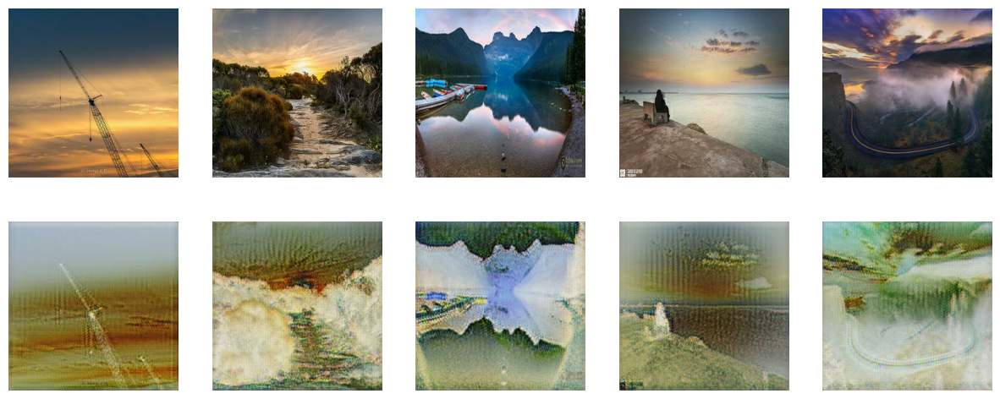

Epoch 26: Generator Loss: 257.0863, Discriminator Loss: 67.6428
Epoch 27: Generator Loss: 255.3459, Discriminator Loss: 66.4356
Epoch 28: Generator Loss: 259.3173, Discriminator Loss: 66.4676
Epoch 29: Generator Loss: 259.9171, Discriminator Loss: 66.9246
Epoch 30: Generator Loss: 259.8844, Discriminator Loss: 66.4817


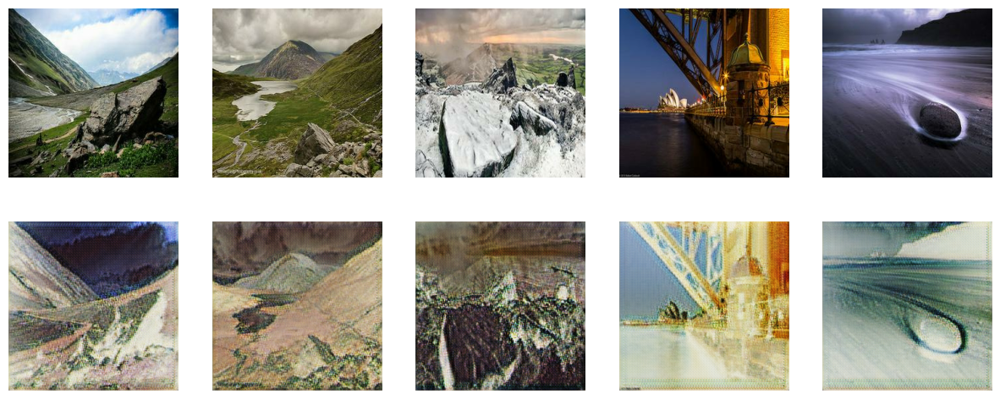

Epoch 31: Generator Loss: 257.5219, Discriminator Loss: 67.1855
Epoch 32: Generator Loss: 249.2810, Discriminator Loss: 66.6887
Epoch 33: Generator Loss: 244.5533, Discriminator Loss: 66.5463
Epoch 34: Generator Loss: 255.4173, Discriminator Loss: 67.3605
Epoch 35: Generator Loss: 249.6575, Discriminator Loss: 66.4156


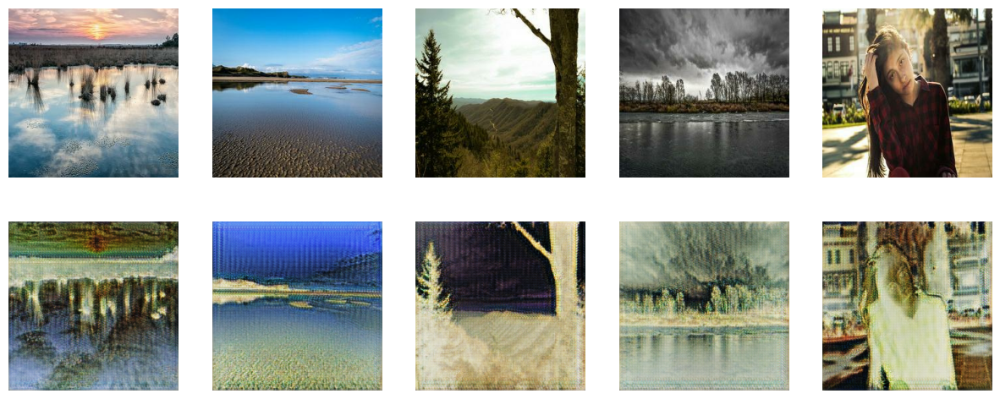

Epoch 36: Generator Loss: 255.2642, Discriminator Loss: 66.7378
Epoch 37: Generator Loss: 252.0367, Discriminator Loss: 66.8154
Epoch 38: Generator Loss: 244.6698, Discriminator Loss: 66.0378
Epoch 39: Generator Loss: 241.5110, Discriminator Loss: 66.5924
Epoch 40: Generator Loss: 232.0581, Discriminator Loss: 66.1984


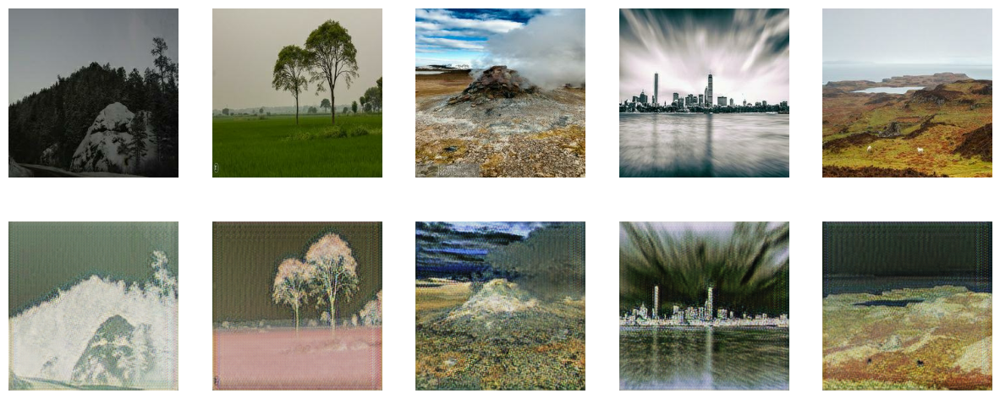

Epoch 41: Generator Loss: 244.8959, Discriminator Loss: 65.7681
Epoch 42: Generator Loss: 232.8375, Discriminator Loss: 66.9867
Epoch 43: Generator Loss: 238.0984, Discriminator Loss: 66.9831
Epoch 44: Generator Loss: 245.2994, Discriminator Loss: 69.1197
Epoch 45: Generator Loss: 240.0752, Discriminator Loss: 66.8515


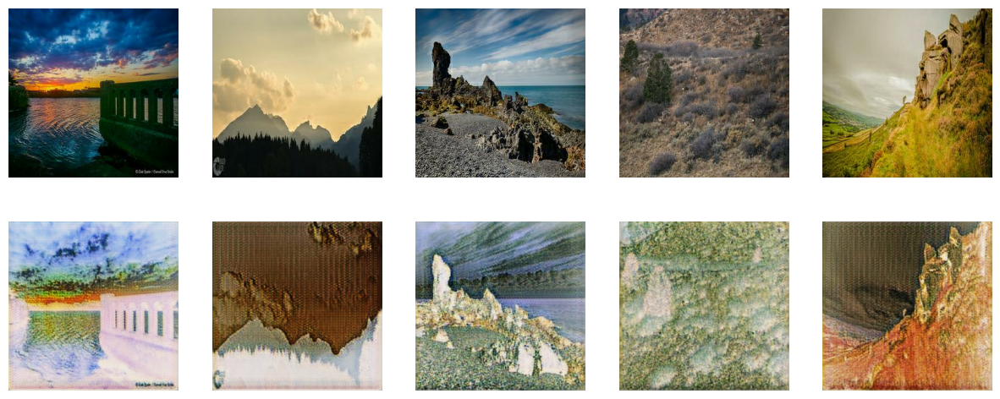

Epoch 46: Generator Loss: 239.2680, Discriminator Loss: 66.8576
Epoch 47: Generator Loss: 231.0452, Discriminator Loss: 67.3369
Epoch 48: Generator Loss: 231.3209, Discriminator Loss: 66.2768
Epoch 49: Generator Loss: 242.3898, Discriminator Loss: 66.4923
Epoch 50: Generator Loss: 237.9520, Discriminator Loss: 66.3288


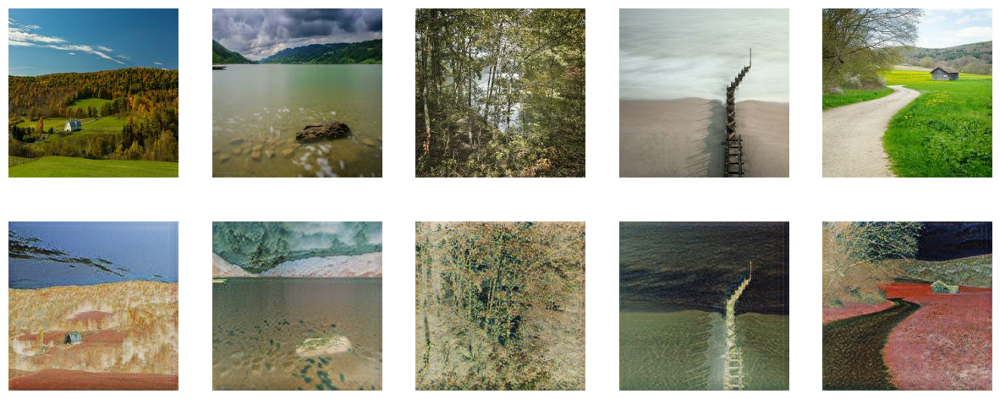

In [ ]:
# Training loop
EPOCHS = 50

total_generator_losses = []
total_discriminator_losses = []
avg_generator_losses = []
avg_discriminator_losses = []

for epoch in range(EPOCHS):
    total_gen_loss, total_disc_loss = 0, 0

    for photo, monet in tf.data.Dataset.zip((photo_dataset, monet_dataset)):
        gen_loss, disc_loss = train_step(photo, monet)
        total_gen_loss += gen_loss
        total_disc_loss += disc_loss

    total_generator_losses.append(total_gen_loss)
    total_discriminator_losses.append(total_disc_loss)
    avg_generator_losses.append(total_gen_loss / len(photo_dataset))
    avg_discriminator_losses.append(total_disc_loss / len(photo_dataset))

    print(f"Epoch {epoch+1}: Generator Loss: {total_gen_loss.numpy():.4f}, Discriminator Loss: {total_disc_loss.numpy():.4f}")

    if (epoch + 1) % 5 == 0:  # Generate images every 5 epochs
        display_generated_images()

# Save models
generator_g.save("my_generator_g.keras")


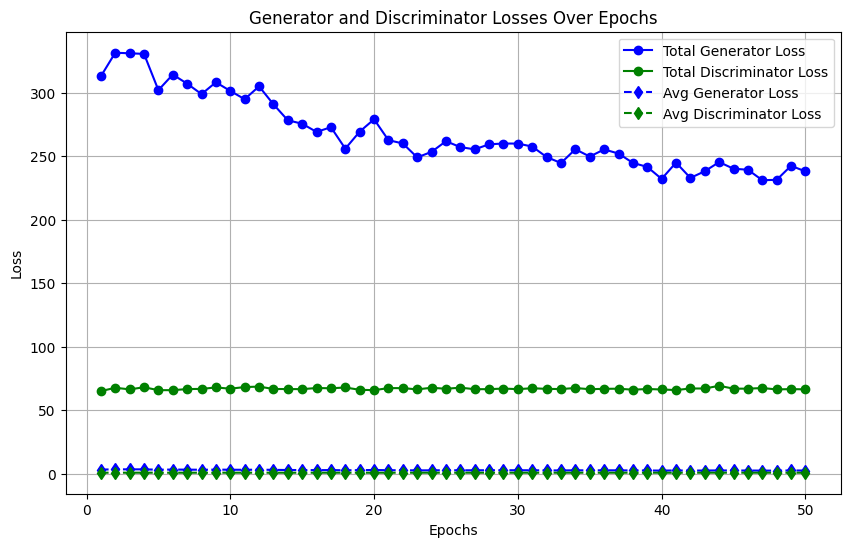

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(range(1, EPOCHS + 1), total_generator_losses, label="Total Generator Loss", marker='o', color='blue')
plt.plot(range(1, EPOCHS + 1), total_discriminator_losses, label="Total Discriminator Loss", marker='o', color='green')
plt.plot(range(1, EPOCHS + 1), avg_generator_losses, label="Avg Generator Loss", linestyle='--', marker='d', color='blue')
plt.plot(range(1, EPOCHS + 1), avg_discriminator_losses, label="Avg Discriminator Loss", linestyle='--', marker='d', color='green')
plt.title("Generator and Discriminator Losses Over Epochs")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()
plt.grid()
plt.show()


## Analysis


## Hyperparameter tuning
We're going to run a small test to demonstrate a possible method of hyperparameter tuning using Optuna. If this was a full fledged research project, we would set more parameters and with a wider variance, so that we can get way more data on what parameters work and why.

In [ ]:
# Optuna Objective Function
def objective(trial):
    # Suggest hyperparameters
    learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-3)
    beta_1 = trial.suggest_float("beta_1", 0.5, 0.9)
    generator_filters = trial.suggest_categorical("generator_filters", [32, 64, 128])
    discriminator_filters = trial.suggest_categorical("discriminator_filters", [64, 128, 256])

    # Modified Generator
    def build_generator(filters=generator_filters):
        inputs = layers.Input(shape=[IMG_HEIGHT, IMG_WIDTH, 3])

        # Downsampling
        x = layers.Conv2D(filters, 4, strides=2, padding='same')(inputs)
        x = layers.LeakyReLU()(x)

        x = layers.Conv2D(filters * 2, 4, strides=2, padding='same')(x)
        x = layers.LeakyReLU()(x)

        # Residual blocks
        for _ in range(4):
            res = x
            x = layers.Conv2D(filters * 2, 3, padding='same')(x)
            x = layers.LeakyReLU()(x)
            x = layers.Conv2D(filters * 2, 3, padding='same')(x)
            x = layers.Add()([x, res])

        # Upsampling
        x = layers.Conv2DTranspose(filters, 4, strides=2, padding='same')(x)
        x = layers.LeakyReLU()(x)

        x = layers.Conv2DTranspose(3, 4, strides=2, padding='same', activation='tanh')(x)
        return tf.keras.Model(inputs, x)

    # Modified Discriminator
    def build_discriminator(filters=discriminator_filters):
        inputs = layers.Input(shape=[IMG_HEIGHT, IMG_WIDTH, 3])
        x = layers.Conv2D(filters, 4, strides=2, padding='same')(inputs)
        x = layers.LeakyReLU()(x)

        x = layers.Conv2D(filters * 2, 4, strides=2, padding='same')(x)
        x = layers.LeakyReLU()(x)

        x = layers.Conv2D(filters * 4, 4, strides=2, padding='same')(x)
        x = layers.LeakyReLU()(x)

        x = layers.Conv2D(1, 4, strides=1, padding='same')(x)
        return tf.keras.Model(inputs, x)

    # Instantiate Models
    generator_g = build_generator()
    discriminator_y = build_discriminator()

    # Loss Functions
    loss_obj = tf.keras.losses.BinaryCrossentropy(from_logits=True)

    def generator_loss(generated):
        return loss_obj(tf.ones_like(generated), generated)

    def discriminator_loss(real, generated):
        real_loss = loss_obj(tf.ones_like(real), real)
        generated_loss = loss_obj(tf.zeros_like(generated), generated)
        return (real_loss + generated_loss) * 0.5

    # Optimizers
    generator_g_optimizer = tf.keras.optimizers.Adam(learning_rate, beta_1)
    discriminator_y_optimizer = tf.keras.optimizers.Adam(learning_rate, beta_1)

    # Training Step
    @tf.function
    def train_step(real_x, real_y):
        with tf.GradientTape(persistent=True) as tape:
            fake_y = generator_g(real_x, training=True)
            disc_fake_y = discriminator_y(fake_y, training=True)
            disc_real_y = discriminator_y(real_y, training=True)

            gen_g_loss = generator_loss(disc_fake_y)
            disc_y_loss = discriminator_loss(disc_real_y, disc_fake_y)

        gradients_g = tape.gradient(gen_g_loss, generator_g.trainable_variables)
        gradients_d = tape.gradient(disc_y_loss, discriminator_y.trainable_variables)

        generator_g_optimizer.apply_gradients(zip(gradients_g, generator_g.trainable_variables))
        discriminator_y_optimizer.apply_gradients(zip(gradients_d, discriminator_y.trainable_variables))

        return gen_g_loss, disc_y_loss

    # Train for a Few Epochs on Your Dataset
    EPOCHS = 2  # Limited epochs for faster tuning
    total_gen_loss, total_disc_loss = 0, 0
    for epoch in range(EPOCHS):
        for photo, monet in tf.data.Dataset.zip((photo_dataset, monet_dataset)).take(10):  # Limit for speed
            gen_loss, disc_loss = train_step(photo, monet)
            total_gen_loss += gen_loss.numpy()
            total_disc_loss += disc_loss.numpy()

    # Return the total generator loss as the metric to minimize
    return total_gen_loss

# Optuna Study
IMG_HEIGHT, IMG_WIDTH = 256, 256  # Image size
study = optuna.create_study(direction="minimize")
study.optimize(objective, n_trials=10)

# Print Best Parameters
print("\nBest Hyperparameters:", study.best_params)


[I 2024-12-10 15:39:59,583] A new study created in memory with name: no-name-86dd58a2-55e4-446f-b430-166d6484ad51
<ipython-input-45-f14fa85b8259>:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-3)
[I 2024-12-10 15:40:10,100] Trial 0 finished with value: 15.520432502031326 and parameters: {'learning_rate': 0.00018317973083709614, 'beta_1': 0.5774231741314255, 'generator_filters': 32, 'discriminator_filters': 128}. Best is trial 0 with value: 15.520432502031326.
[I 2024-12-10 15:40:20,718] Trial 1 finished with value: 13.769784331321716 and parameters: {'learning_rate': 1.2253443893734342e-05, 'beta_1': 0.8970777312014747, 'generator_filters': 32, 'discriminator_filters': 128}. Best is trial 1 with value: 13.769784331321716.
[I 2024-12-10 15:40:26,869] Trial 2 fi

Best Hyperparameters: {'learning_rate': 0.00011395867959420804, 'beta_1': 0.7927076169759024, 'generator_filters': 128, 'discriminator_filters': 64}


In [ ]:
trials = study.trials_dataframe()
print(trials.info())
print(trials.head())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10 entries, 0 to 9
Data columns (total 10 columns):
 #   Column                        Non-Null Count  Dtype          
---  ------                        --------------  -----          
 0   number                        10 non-null     int64          
 1   value                         10 non-null     float64        
 2   datetime_start                10 non-null     datetime64[ns] 
 3   datetime_complete             10 non-null     datetime64[ns] 
 4   duration                      10 non-null     timedelta64[ns]
 5   params_beta_1                 10 non-null     float64        
 6   params_discriminator_filters  10 non-null     int64          
 7   params_generator_filters      10 non-null     int64          
 8   params_learning_rate          10 non-null     float64        
 9   state                         10 non-null     object         
dtypes: datetime64[ns](2), float64(3), int64(3), object(1), timedelta64[ns](1)
memory usage: 9

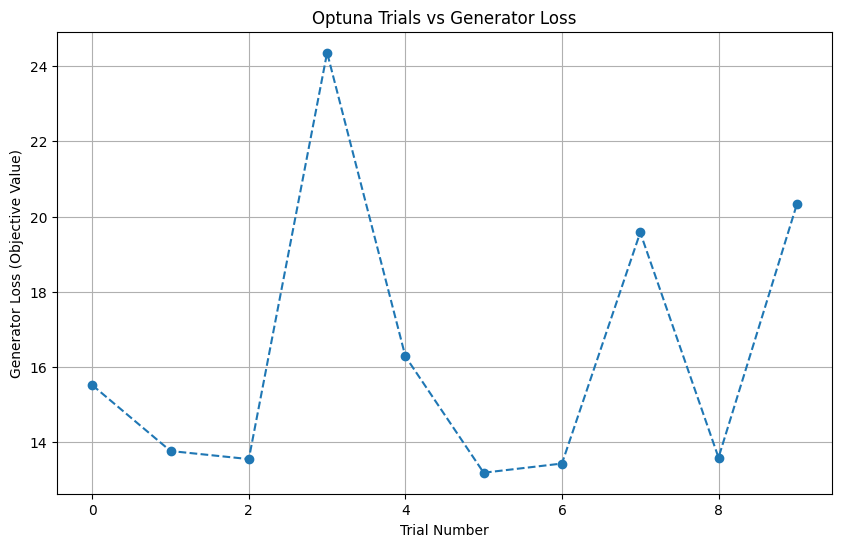

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(trials["number"], trials["value"], marker="o", linestyle="--")
plt.title("Optuna Trials vs Generator Loss")
plt.xlabel("Trial Number")
plt.ylabel("Generator Loss (Objective Value)")
plt.grid()
plt.show()

## Analysis and Conclusion
The method we chose performed well, starting off with a total generator loss around 300. It's performance steadily improved, although the improvements were small, and then appeared to plateau around 240 from epoch 40.

We demonstrated a method to tune the parameters in order to determine the optimal parameters for this problem. This is a challenge that would definitely be continued after the class ends.

## Future work
To improve our score, there are a couple of ideas that come to mind
1. Reduce the strip on the generators. We could reduce the strip to enable the model capture more fine-grained features of the image
2. Add more layers. As discovered in the previous projects, adding more layers can result in a performance increase.
3. Increase the number of residual blocks in the generator. We capped the blocks at 4 for speed reasons.
4. Learning rate scheduling. We could reduce the learning rate gradually with increasing epochs

## Submission
Submit to Kaggle

In [ ]:
output_folder = "images"
os.makedirs(output_folder, exist_ok=True)

def generate_and_zip_images(generator, input_folder, zip_path):
    """
    Generate images for all photos in input_folder and save them directly into a ZIP file.
    """
    image_files = [f for f in os.listdir(input_folder) if f.endswith(".jpg")]

    print(f"Generating and zipping images for {len(image_files)} photos...")

    with zipfile.ZipFile(zip_path, 'w', zipfile.ZIP_DEFLATED) as zipf:
        for image_file in tqdm(image_files, desc="Processing Images"):
            # Load and preprocess the input image
            input_path = os.path.join(input_folder, image_file)
            input_image = load_image(input_path)
            input_image = tf.expand_dims(input_image, axis=0)  # Add batch dimension

            # Generate Monet-style image
            generated_image = generator(input_image, training=False)[0]  # Remove batch dimension

            # Convert generated image to bytes
            generated_image = (generated_image + 1) * 127.5  # Rescale to [0, 255]
            generated_image = tf.cast(generated_image, tf.uint8)
            img_bytes = tf.io.encode_jpeg(generated_image).numpy()

            # Add the generated image directly to ZIP file
            zipf.writestr(image_file, img_bytes)

            # TOD REMOVE BEFORE SUBMITING
            # Save the generated image
            output_path = os.path.join(output_folder, image_file)
            tf.keras.utils.save_img(output_path, generated_image)

    print(f"All images are zipped to: {zip_path}")

# Generate and save directly to a ZIP file
output_zip = "images.zip"
generate_and_zip_images(generator_g, photo_dir, output_zip)
